# Parameters tuning for MCA


This notebook is made for testing the moving clusters algorithm with different parameters to see which ones are the best for trveling wave detection.

In [1]:
%matplotlib widget
import h5py
import numpy as np
import scipy.ndimage as img
import matplotlib.pyplot as plt
import matplotlib.colors as colors
from matplotlib.patches import Polygon as MplPolygon
from Detection_functions import MCDA, circular_mask, preprocessing


## Choose a dataset

In [2]:
condition='anesthesia'
session='evokedD'

Write here the directory of the file where the data is stored

In [3]:
main_directory = r'/media/mathis/Data/Mathis/Original Data/'

Data loading

In [4]:
if condition=='awake':
    fs = 100 #Hz
    pixel_spacing = 0.0566 #mm
    if session=='evoked':
        bks_evoked_path = main_directory+'gaussian_pos4_ziggy_210908.npy'
        Data = np.load(bks_evoked_path)
    elif session=='spontaneous':
        bks_blank_path = main_directory+'blank_ziggy_210908.npy'
        Data = np.load(bks_blank_path)
    mean = np.nanmean(Data)
    nan_loc = np.isnan(Data)
    Data[nan_loc] = mean
    
if condition=='anesthesia':
    fs=110 #Hz
    pixel_spacing = 0.0575 #mm
    if session=='evokedD':
        anesth_evokedD_path = main_directory+'signal_240306_gaussianD.mat'
        file_anesth_evokedD = h5py.File(anesth_evokedD_path)['signal']
        Data = np.array(file_anesth_evokedD)
    elif session=='evokedU':
        anesth_evokedU_path = main_directory+'signal_240306_gaussianU.mat'
        file_anesth_evokedU = h5py.File(anesth_evokedU_path)['signal']
        Data = np.array(file_anesth_evokedU)
    elif session=='spontaneous':
        anesth_blank_path = main_directory+'signal_240306_blank.mat' #change it to adapt to your directories
        file_anesth_blank = h5py.File(anesth_blank_path)['signal']
        Data = np.array(file_anesth_blank)
    

In [5]:
N_trials, Nt, Nx, Ny = Data.shape

In [6]:
if condition=='awake':
    mask = circular_mask((Nx,Ny), center=(220,190), radius=180)
if condition=='anesthesia':
    mask = circular_mask((Nx,Ny), center=(125,140), radius=130)

## Choose a trial

In [7]:
trial_number=7
test_trial=Data[trial_number]
preprocessed_trial = preprocessing(trial=test_trial, border_mask=mask, fs=fs, fc=30, threshold=99)

## Define your test parameters

In [8]:
eps=16
MinPts=32
theta=.40
#sign_level=1e-6

In [9]:
rho = MinPts/eps**2
rho

0.125

## Run MCDA

In [10]:
moving_clusters = MCDA(Trial=preprocessed_trial, epsilon=eps, min_pts=MinPts, Theta=theta)#, significance_level=sign_level)
print(f'{len(moving_clusters)} MC detected')

frame #0
frame #1
frame #2
extension
extension
extension
frame #3
extension
extension
extension
frame #4
extension
frame #5
extension
extension
extension
frame #6
extension
frame #7
extension
extension
frame #8
extension
extension
frame #9
frame #10
frame #11
extension
extension
frame #12
extension
extension
frame #13
extension
frame #14
extension
extension
frame #15
extension
extension
frame #16
extension
extension
frame #17
frame #18
frame #19
frame #20
frame #21
frame #22
frame #23
frame #24
frame #25
frame #26
frame #27
frame #28
frame #29
frame #30
frame #31
frame #32
frame #33
frame #34
frame #35
frame #36
frame #37
frame #38
frame #39
frame #40
frame #41
frame #42
frame #43
frame #44
frame #45
frame #46
frame #47
extension
frame #48
frame #49
extension
frame #50
extension
frame #51
frame #52
frame #53
frame #54
frame #55
frame #56
frame #57
frame #58
frame #59
frame #60
frame #61
frame #62
frame #63
frame #64
frame #65
frame #66
frame #67
frame #68
frame #69
frame #70
frame #71


In [11]:
for mc in moving_clusters:
    print(mc['trace'])#, f'{np.round(np.linalg.norm(mc['Speed'])*fs*pixel_spacing/1000,3)} m/s'))

[1, 2, 3]
[1, 2, 3]
[6, 7, 8]
[1, 2, 3, 4, 5, 6, 7, 8]
[10, 11, 12, 13]
[13, 14, 15]
[14, 15, 16]


## Visualise the wave detection

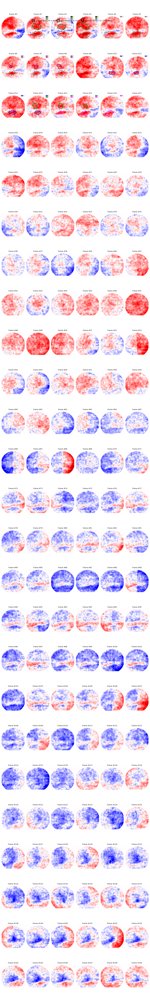

In [12]:
Norm = colors.Normalize(vmax=1, vmin=-1)
nlong=Nt//6
colors_clust=['k.', 'gv','ko','c+','k.','g.','c.', 'y.', 'b.']
contour_colors=['k', 'darkgreen','purple','dimgray', 'blue','green', 'fuchsia']
fig, axs = plt.subplots(nlong,6,layout='tight',figsize=(15,nlong*4)) #figsize=(15,30))# (15,60) #### adapt it to see clearly
fig.suptitle(f"Wave detection in {condition.capitalize()} {session} data, trial {trial_number} with eps={eps}, MinPts={MinPts}, Theta={int(theta*100)}%")

for k in range(Nt): #plot background
    axs[k//6, k%6].imshow(img.gaussian_filter(test_trial[k], sigma=5, mode='constant')*mask, cmap='seismic', norm=Norm)
    axs[k//6, k%6].set_title(f'Frame #{k}')
    axs[k//6, k%6].axis('off')
for mc_numb,mc in enumerate(moving_clusters): #plot points implied in valid moving clusters
    for i,j in enumerate(mc['trace']):
        #axs[j//6, j%6].plot(mc['points'][i][:,1], mc['points'][i][:,0], colors_clust[mc_numb], alpha=.1)
        x, y = mc['alpha shapes'][i].exterior.xy
        mpl_poly = MplPolygon(np.vstack((y,x)).T, closed=True, edgecolor=contour_colors[mc_numb%len(contour_colors)], facecolor='none', linewidth=3, label=f'{mc_numb}')
        axs[j//6, j%6].add_patch(mpl_poly)
        axs[j//6, j%6].legend(fontsize='xx-small')

In [13]:
n1=4
n2=6

In [14]:
s1=moving_clusters[n1]['alpha shapes'][-1]
s2=moving_clusters[n2]['alpha shapes'][0]

In [15]:
x1, y1 = s1.exterior.xy
x2, y2 = s2.exterior.xy

mpl_poly1 = MplPolygon(np.vstack((y1,x1)).T, closed=True, edgecolor='b', facecolor='none', linewidth=3)
mpl_poly2 = MplPolygon(np.vstack((y2,x2)).T, closed=True, edgecolor='g', facecolor='none', linewidth=3)

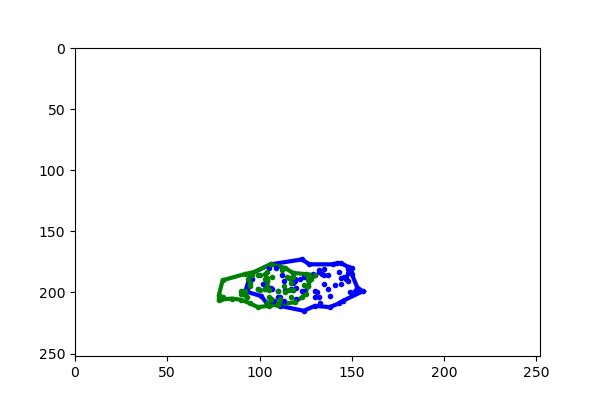

In [16]:
figbonus, ax = plt.subplots(1,1, figsize=(6,4))
ax.plot(moving_clusters[n1]['points'][-1][:,1],moving_clusters[n1]['points'][-1][:,0],'b.')
ax.plot(moving_clusters[n2]['points'][ 0][:,1],moving_clusters[n2]['points'][ 0][:,0],'g.')
ax.add_patch(mpl_poly1)
ax.add_patch(mpl_poly2)
ax.set_xlim(0,Nx)
ax.set_ylim(0,Ny)
ax.invert_yaxis()


In [17]:
s1.intersection(s2).area/s1.union(s2).area

0.3639542739061899

Save the figure

In [19]:
#fig.savefig('Ex D.png')